In [74]:
# Importing the required libraries
import pandas as pd, numpy as np
import matplotlib.pyplot as plt, seaborn as sns
import sklearn
from scipy import stats
%matplotlib inline

In [75]:
# Importing required packages for visualization
from IPython.display import Image  
# from sklearn.externals.six import StringIO  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split

### A) Load the Data 
Loading the data from CSV for US Heart Attack Patients

In [76]:
# Reading the csv file and putting it into 'df' object.
df = pd.read_csv('US_Heart_Patients.csv')

Total Number of Rows X Total Number of Columns

In [77]:
df.shape


(4240, 16)

### B) Perform the exploratory data analysis

#### 1. First 10 Rows of Data

In [78]:
df.head(10)

,Gender,age,education,currentSmoker,cigsPerDay,BP Meds,prevalentStroke,prevalentHyp,diabetes,tot cholesterol,Systolic BP,Diastolic BP,BMI,heartRate,glucose,Heart-Att
0,Male,39.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,Female,46.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,Male,48.0,1.0,1.0,20.0,0.0,0.0,0.0,0.0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,Female,61.0,3.0,1.0,30.0,0.0,0.0,1.0,0.0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,Female,46.0,3.0,1.0,23.0,0.0,0.0,0.0,0.0,285.0,130.0,84.0,23.10,85.0,85.0,0
5,Female,43.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,228.0,180.0,110.0,30.30,77.0,99.0,0
6,Female,63.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,138.0,71.0,33.11,60.0,85.0,1
7,Female,45.0,2.0,1.0,20.0,0.0,0.0,0.0,0.0,313.0,100.0,71.0,21.68,79.0,78.0,0
8,Male,52.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,260.0,141.5,89.0,26.36,76.0,79.0,0
9,Male,43.0,1.0,1.0,30.0,0.0,0.0,1.0,0.0,225.0,162.0,107.0,23.61,93.0,88.0,0


#### 2. 5-points summary

In [7]:
# Calculate the five-number summary for numeric variables
summary = df.describe().loc[['min', '25%', '50%', '75%', 'max']]
print(summary)

      age  education  currentSmoker  cigsPerDay  BP Meds  prevalentStroke  \
min  32.0        1.0            0.0         0.0      0.0              0.0   
25%  42.0        1.0            0.0         0.0      0.0              0.0   
50%  49.0        2.0            0.0         0.0      0.0              0.0   
75%  56.0        3.0            1.0        20.0      0.0              0.0   
max  70.0        4.0            1.0        70.0      1.0              1.0   

     prevalentHyp  diabetes  tot cholesterol  Systolic BP  Diastolic BP  \
min           0.0       0.0            107.0         83.5          48.0   
25%           0.0       0.0            206.0        117.0          75.0   
50%           0.0       0.0            234.0        128.0          82.0   
75%           1.0       0.0            263.0        144.0          90.0   
max           1.0       1.0            696.0        295.0         142.5   

        BMI  heartRate  glucose  Heart-Att  
min  15.540       44.0     40.0        0.

#### 3. Information About Columns (Data types)

In [8]:
df.dtypes

Gender              object
age                float64
education          float64
currentSmoker      float64
cigsPerDay         float64
BP Meds            float64
prevalentStroke    float64
prevalentHyp       float64
diabetes           float64
tot cholesterol    float64
Systolic BP        float64
Diastolic BP       float64
BMI                float64
heartRate          float64
glucose            float64
Heart-Att            int64
dtype: object

#### 4. Number of outliers(extra points)

In [9]:
def find_outliers(col):
    q1 = col.quantile(.25)
    q3 = col.quantile(.75)
    IQR = q3 - q1
    ll = q1 - (1.5*IQR)
    ul = q3 + (1.5*IQR)
    upper_outliers = col[col > ul].index.tolist()
    lower_outliers = col[col < ll].index.tolist()
    
    bad_indices = list(set(upper_outliers + lower_outliers))
    return(bad_indices)

import numpy as np
bad_indexes = []
col_with_outlier = []
for col in df.columns:
    if df[col].dtype in ["int64","float64"]:
       bad_indexes.append(find_outliers(df[col]))

bad_indexes = set(list(np.concatenate(bad_indexes).flat))
print(len(bad_indexes))
print(f"All Bad indexes:{bad_indexes}")   


1097
All Bad indexes:{4096.0, 3.0, 4100.0, 6.0, 4106.0, 2058.0, 4108.0, 13.0, 4109.0, 15.0, 2063.0, 17.0, 4111.0, 4115.0, 2068.0, 22.0, 4118.0, 4119.0, 25.0, 4123.0, 28.0, 2075.0, 4125.0, 2079.0, 32.0, 33.0, 35.0, 4132.0, 37.0, 2087.0, 2088.0, 42.0, 2091.0, 44.0, 2093.0, 46.0, 48.0, 4144.0, 2098.0, 50.0, 2099.0, 56.0, 4154.0, 2106.0, 59.0, 4155.0, 4158.0, 2111.0, 64.0, 65.0, 66.0, 2112.0, 4164.0, 2114.0, 4163.0, 4168.0, 2120.0, 74.0, 75.0, 4171.0, 4173.0, 78.0, 2125.0, 81.0, 2131.0, 2132.0, 87.0, 2136.0, 2137.0, 4188.0, 4189.0, 4190.0, 94.0, 96.0, 4193.0, 4194.0, 98.0, 4192.0, 97.0, 4199.0, 4203.0, 108.0, 107.0, 2155.0, 4207.0, 4209.0, 2162.0, 114.0, 115.0, 116.0, 4213.0, 4215.0, 2167.0, 4214.0, 2170.0, 123.0, 4220.0, 4221.0, 2174.0, 4223.0, 4222.0, 2175.0, 2177.0, 2179.0, 2180.0, 4228.0, 4226.0, 2181.0, 4232.0, 137.0, 138.0, 2187.0, 139.0, 140.0, 4233.0, 143.0, 145.0, 2194.0, 2195.0, 148.0, 2197.0, 152.0, 153.0, 154.0, 2204.0, 158.0, 2206.0, 2208.0, 161.0, 162.0, 2209.0, 165.0, 2214.0

#### 5. Any missing value

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           4232 non-null   object 
 1   age              4238 non-null   float64
 2   education        4130 non-null   float64
 3   currentSmoker    4237 non-null   float64
 4   cigsPerDay       4209 non-null   float64
 5   BP Meds          4180 non-null   float64
 6   prevalentStroke  4231 non-null   float64
 7   prevalentHyp     4238 non-null   float64
 8   diabetes         4238 non-null   float64
 9   tot cholesterol  4180 non-null   float64
 10  Systolic BP      4236 non-null   float64
 11  Diastolic BP     4235 non-null   float64
 12  BMI              4216 non-null   float64
 13  heartRate        4236 non-null   float64
 14  glucose          3849 non-null   float64
 15  Heart-Att        4240 non-null   int64  
dtypes: float64(14), int64(1), object(1)
memory usage: 530.1+ KB


####All these have missing Data because we have 4240 rows
 
0   age              4238 non-null   float64 
2   currentSmoker    4237 non-null   float64
4   prevalentStroke  4231 non-null   float64
5   prevalentHyp     4238 non-null   float64
6   diabetes         4238 non-null   float64
8   Systolic BP      4236 non-null   float64
9   Diastolic BP     4235 non-null   float64
10  BMI              4216 non-null   float64
11  heartRate        4236 non-null   float64
12  glucose          3849 non-null   float64



### Showing Missing Value for Glucose Column (Glucose has 391 missing values)

In [11]:
# creating bool series True for NaN values  
bool_series = pd.isnull(df["glucose"])  
    
# filtering data  
# displaying data only with Gender = NaN  
df[bool_series]  


,Gender,age,education,currentSmoker,cigsPerDay,BP Meds,prevalentStroke,prevalentHyp,diabetes,tot cholesterol,Systolic BP,Diastolic BP,BMI,heartRate,glucose,Heart-Att
14,Female,39.0,2.0,1.0,9.0,0.0,0.0,0.0,0.0,NaN,114.0,64.0,22.35,85.0,NaN,0
21,Female,43.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,185.0,123.5,77.5,29.89,70.0,NaN,0
26,Female,60.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,260.0,110.0,72.5,26.59,65.0,NaN,0
42,Female,52.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,NaN,148.0,92.0,25.09,70.0,NaN,1
54,Female,39.0,2.0,1.0,20.0,0.0,0.0,0.0,0.0,209.0,115.0,75.0,22.54,90.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4170,Female,41.0,2.0,1.0,5.0,0.0,0.0,0.0,0.0,205.0,105.0,74.0,20.85,87.0,NaN,0
4208,Female,51.0,1.0,1.0,9.0,0.0,0.0,0.0,0.0,340.0,152.0,76.0,25.74,70.0,NaN,0
4229,Female,51.0,3.0,1.0,20.0,0.0,0.0,1.0,0.0,251.0,140.0,80.0,25.60,75.0,NaN,0
4230,Female,56.0,1.0,1.0,3.0,0.0,0.0,1.0,0.0,268.0,170.0,102.0,22.89,57.0,NaN,0


### Showing Outlier of BMI Column

<Axes: ylabel='BMI'>

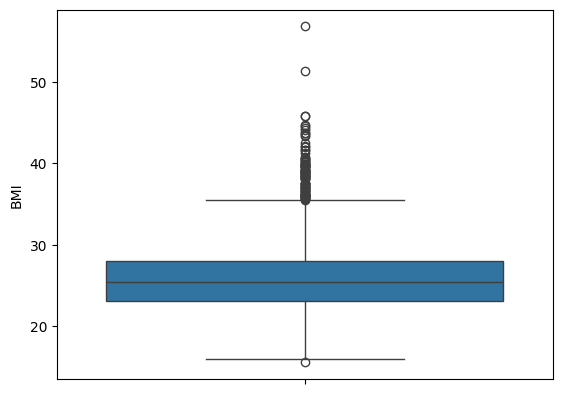

In [12]:
import seaborn as sns
sns.boxplot(df['BMI'])

### Removing Outlier of BMI Column

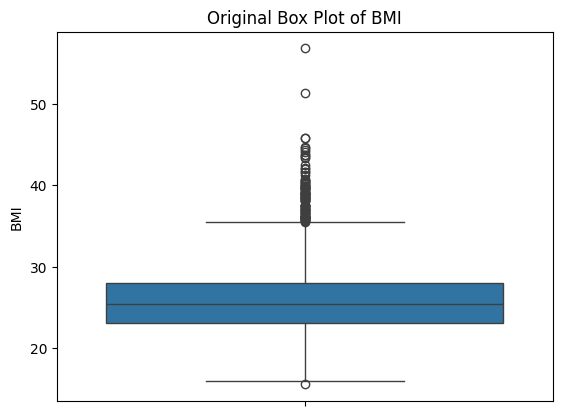

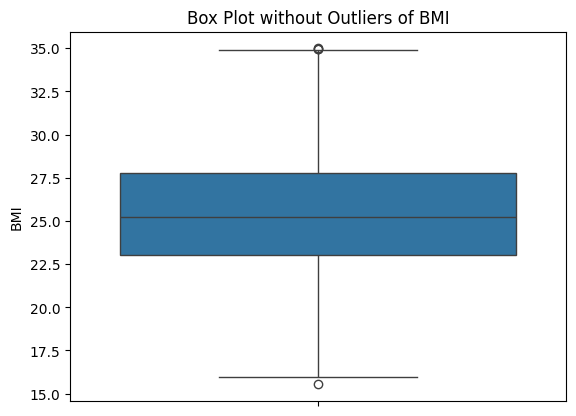

In [13]:
def removal_box_plot(df, column, threshold):
    sns.boxplot(df[column])
    plt.title(f'Original Box Plot of {column}')
    plt.show()
 
    removed_outliers = df[df[column] <= threshold]
 
    sns.boxplot(removed_outliers[column])
    plt.title(f'Box Plot without Outliers of {column}')
    plt.show()
    return removed_outliers
 
 
threshold_value = 35
 
no_outliers = removal_box_plot(df, 'BMI', threshold_value)

#### 6. Correlation between variables

#### 7. Distribution of the data
##### Will do once we do pre-processing of data

In [79]:
# Putting feature variable to X
X = df.drop('Heart-Att',axis=1)

# Putting response variable to y
Y = df['Heart-Att']

### C) DATA PREPROCESSING



### 1. Encode Categorical Data ###
#### Convert Gender column from string to bool as we will do data pre-processing in numbers format only

In [80]:
df = pd.get_dummies(df, columns=['Gender'], drop_first=True)



In [81]:
df.columns


Index(['age', 'education', 'currentSmoker', 'cigsPerDay', 'BP Meds',
       'prevalentStroke', 'prevalentHyp', 'diabetes', 'tot cholesterol',
       'Systolic BP', 'Diastolic BP', 'BMI', 'heartRate', 'glucose',
       'Heart-Att', 'Gender_Male'],
      dtype='object')

In [82]:
df.dtypes

age                float64
education          float64
currentSmoker      float64
cigsPerDay         float64
BP Meds            float64
prevalentStroke    float64
prevalentHyp       float64
diabetes           float64
tot cholesterol    float64
Systolic BP        float64
Diastolic BP       float64
BMI                float64
heartRate          float64
glucose            float64
Heart-Att            int64
Gender_Male           bool
dtype: object

In [83]:
df.head()

,age,education,currentSmoker,cigsPerDay,BP Meds,prevalentStroke,prevalentHyp,diabetes,tot cholesterol,Systolic BP,Diastolic BP,BMI,heartRate,glucose,Heart-Att,Gender_Male
0,39.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,195.0,106.0,70.0,26.97,80.0,77.0,0,True
1,46.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,250.0,121.0,81.0,28.73,95.0,76.0,0,False
2,48.0,1.0,1.0,20.0,0.0,0.0,0.0,0.0,245.0,127.5,80.0,25.34,75.0,70.0,0,True
3,61.0,3.0,1.0,30.0,0.0,0.0,1.0,0.0,225.0,150.0,95.0,28.58,65.0,103.0,1,False
4,46.0,3.0,1.0,23.0,0.0,0.0,0.0,0.0,285.0,130.0,84.0,23.10,85.0,85.0,0,False


### 2. Handling Outliers

In [84]:
def remove_outlier(df,col):
#remove outliers
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    print(f'Lower Bound of {col} is {lower_bound}')
    print(f'Upper Bound of {col} is {upper_bound}')
    print(f'Median of {col} is {df[col].median()}')
    #filter = (df['column'] >= Q1 - 1.5 * IQR) & (df['column'] <= Q3 + 1.5 *IQR)
    df.loc[df[col] < lower_bound, col] = df[col].median()
    df.loc[df[col] > upper_bound, col] = df[col].median()
    #df_clean = df.loc[filter]  
    return df

#Dropping Heart Attack column while treating Outlier as its expected result and not input data
df_new= df.drop('Heart-Att',axis=1)

for col in df_new.columns.to_list():
    if df_new[col].dtype in ["int64","float64"]:
        df_cleaned = remove_outlier(df_new,col)
    #print(f'Cleaned {col} is: {df_cleaned[col]}')    

df_cleaned.to_csv('Data_After_Removing_Outlier.csv')
# Print the cleaned DataFrame
print("Cleaned DataFrame:")
print(df_cleaned)

#df_cleaned.to_csv('.\ProcessedData.csv')
# Print the cleaned DataFrame
#print("Cleaned DataFrame:")
#print(df_cleaned)
#print(df)

Lower Bound of age is 21.0
Upper Bound of age is 77.0
Median of age is 49.0
Lower Bound of education is -2.0
Upper Bound of education is 6.0
Median of education is 2.0
Lower Bound of currentSmoker is -1.5
Upper Bound of currentSmoker is 2.5
Median of currentSmoker is 0.0
Lower Bound of cigsPerDay is -30.0
Upper Bound of cigsPerDay is 50.0
Median of cigsPerDay is 0.0
Lower Bound of BP Meds is 0.0
Upper Bound of BP Meds is 0.0
Median of BP Meds is 0.0
Lower Bound of prevalentStroke is 0.0
Upper Bound of prevalentStroke is 0.0
Median of prevalentStroke is 0.0
Lower Bound of prevalentHyp is -1.5
Upper Bound of prevalentHyp is 2.5
Median of prevalentHyp is 0.0
Lower Bound of diabetes is 0.0
Upper Bound of diabetes is 0.0
Median of diabetes is 0.0
Lower Bound of tot cholesterol is 120.5
Upper Bound of tot cholesterol is 348.5
Median of tot cholesterol is 234.0
Lower Bound of Systolic BP is 76.5
Upper Bound of Systolic BP is 184.5
Median of Systolic BP is 128.0
Lower Bound of Diastolic BP is 

### 3. Impute the missing values (if any)
Filling missing Values with mean of all values in that column


In [85]:
col_list = df.columns.to_list()
for col_name in col_list:
    df[col_name].fillna(df[col_name].mean(), inplace=True)




C:\Users\priyankakapoor\AppData\Local\Temp\ipykernel_20156\4040053867.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col_name].fillna(df[col_name].mean(), inplace=True)


### Save Processed DATA in CSV  ####

In [86]:

df.to_csv("Final_Processed_Data.csv")

### Distribution of the data

In [87]:
# Putting feature variable to X
X = df.drop('Heart-Att',axis=1)

# Putting response variable to y
y = df['Heart-Att']

In [24]:
X

,age,education,currentSmoker,cigsPerDay,BP Meds,prevalentStroke,prevalentHyp,diabetes,tot cholesterol,Systolic BP,Diastolic BP,BMI,heartRate,glucose,Gender_Male
0,39.0,4.0,0.0,0.0,0.000000,0.0,0.0,0.0,195.0,106.0,70.0,26.97,80.0,77.000000,True
1,46.0,2.0,0.0,0.0,0.000000,0.0,0.0,0.0,250.0,121.0,81.0,28.73,95.0,76.000000,False
2,48.0,1.0,1.0,20.0,0.000000,0.0,0.0,0.0,245.0,127.5,80.0,25.34,75.0,70.000000,True
3,61.0,3.0,1.0,30.0,0.000000,0.0,1.0,0.0,225.0,150.0,95.0,28.58,65.0,103.000000,False
4,46.0,3.0,1.0,23.0,0.000000,0.0,0.0,0.0,285.0,130.0,84.0,23.10,85.0,85.000000,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4235,48.0,2.0,1.0,20.0,0.029665,0.0,0.0,0.0,248.0,131.0,72.0,22.00,84.0,86.000000,False
4236,44.0,1.0,1.0,15.0,0.000000,0.0,0.0,0.0,210.0,126.5,87.0,19.16,86.0,81.951936,False
4237,52.0,2.0,0.0,0.0,0.000000,0.0,0.0,0.0,269.0,133.5,83.0,21.47,80.0,107.000000,False
4238,40.0,3.0,0.0,0.0,0.000000,0.0,1.0,0.0,185.0,141.0,98.0,25.60,67.0,72.000000,True


In [25]:
y

0       0
1       0
2       0
3       1
4       0
       ..
4235    0
4236    0
4237    0
4238    0
4239    0
Name: Heart-Att, Length: 4240, dtype: int64

In [89]:
y.value_counts()

Heart-Att
0    3596
1     644
Name: count, dtype: int64

#### Number of Healthy and Heart Attack Patient

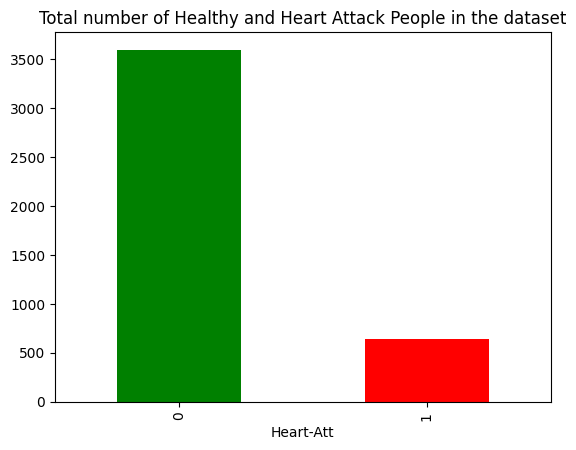

In [90]:
# plot the category count
y.value_counts().plot.bar(color = ["g","r"]) 
plt.title('Total number of Healthy and Heart Attack People in the dataset') 
plt.show()

### D) Split Data Sets
Split the data into 80% training dataset and 20% test dataset

In [91]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)
print("TRAIN X SHAPE:",X_train.shape)
print("TRAIN Y SHAPE:",y_train.shape)
print("VALUE COUNTS:\n",y_train.value_counts())
print("TEST X SHAPE :",X_test.shape)
print("TEST Y SHAPE :",y_test.shape)

TRAIN X SHAPE: (3392, 15)
TRAIN Y SHAPE: (3392,)
VALUE COUNTS:
 Heart-Att
0    2871
1     521
Name: count, dtype: int64
TEST X SHAPE : (848, 15)
TEST Y SHAPE : (848,)


### E) Model preparation and evaluation using Decision Tree Classifier

Creating helper functions to evaluate model performance and help plot the decision tree

In [92]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X.columns, 
                    class_names=['Healthy', "Heart Attack"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [93]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

### Training the Model Without setting any hyper-parameters

In [94]:
dt_default = DecisionTreeClassifier(random_state=42)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [95]:
gph = get_dt_graph(dt_default)


In [96]:
Image(gph.create_png())

In [98]:
with open('temp.png', 'wb') as f:
    f.write(gph.create_png())

In [97]:
evaluate_model(dt_default)

Train Accuracy : 1.0
Train Confusion Matrix:
[[2871    0]
 [   0  521]]
--------------------------------------------------
Test Accuracy : 0.7393867924528302
Test Confusion Matrix:
[[605 120]
 [101  22]]


### Controlling the depth of the tree

In [99]:
dt_depth = DecisionTreeClassifier(max_depth=3)
dt_depth.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

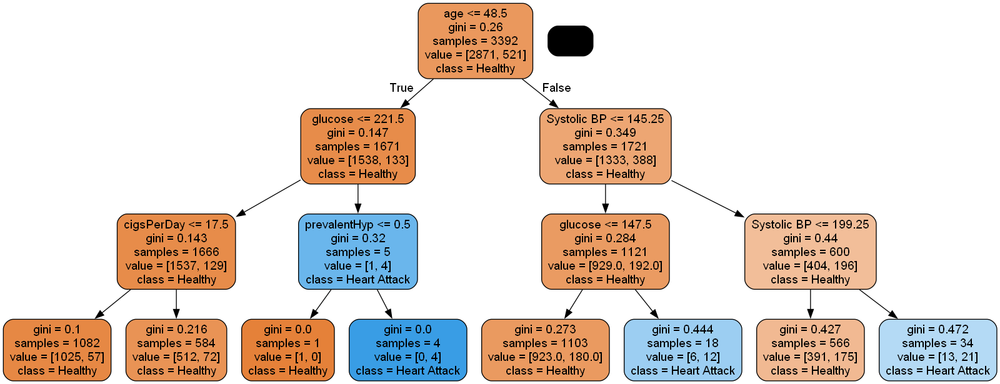

In [100]:
gph = get_dt_graph(dt_depth) 
Image(gph.create_png())

In [101]:
evaluate_model(dt_depth)

Train Accuracy : 0.8517099056603774
Train Confusion Matrix:
[[2852   19]
 [ 484   37]]
--------------------------------------------------
Test Accuracy : 0.8514150943396226
Test Confusion Matrix:
[[718   7]
 [119   4]]


### Specifying minimum samples before split

In [102]:
dt_min_split = DecisionTreeClassifier(min_samples_split=20)
dt_min_split.fit(X_train, y_train)

DecisionTreeClassifier(min_samples_split=20)

In [103]:
gph = get_dt_graph(dt_min_split) 
Image(gph.create_png())

In [104]:
evaluate_model(dt_min_split)

Train Accuracy : 0.9027122641509434
Train Confusion Matrix:
[[2795   76]
 [ 254  267]]
--------------------------------------------------
Test Accuracy : 0.7900943396226415
Test Confusion Matrix:
[[654  71]
 [107  16]]


### Specifying minimum samples in leaf node

In [105]:
dt_min_leaf = DecisionTreeClassifier(min_samples_leaf=20, random_state=42)
dt_min_leaf.fit(X_train, y_train)

DecisionTreeClassifier(min_samples_leaf=20, random_state=42)

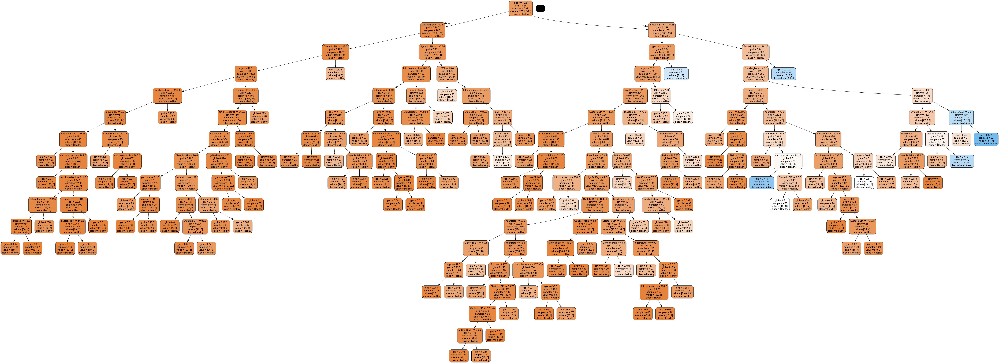

In [106]:
gph = get_dt_graph(dt_min_leaf)
Image(gph.create_png())

In [107]:
evaluate_model(dt_min_leaf)

Train Accuracy : 0.8590801886792453
Train Confusion Matrix:
[[2821   50]
 [ 428   93]]
--------------------------------------------------
Test Accuracy : 0.8502358490566038
Test Confusion Matrix:
[[712  13]
 [114   9]]


### Using Entropy instead of Gini

In [108]:
dt_min_leaf_entropy = DecisionTreeClassifier(min_samples_leaf=20, random_state=42, criterion="entropy")
dt_min_leaf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', min_samples_leaf=20,
                       random_state=42)

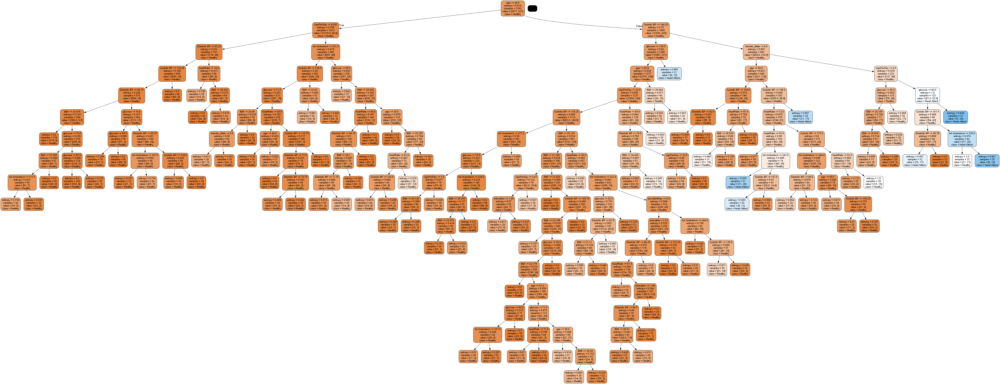

In [109]:
gph = get_dt_graph(dt_min_leaf_entropy)
Image(gph.create_png())

In [110]:
evaluate_model(dt_min_leaf_entropy)

Train Accuracy : 0.8590801886792453
Train Confusion Matrix:
[[2803   68]
 [ 410  111]]
--------------------------------------------------
Test Accuracy : 0.8419811320754716
Test Confusion Matrix:
[[704  21]
 [113  10]]


### Hyper-parameter tuning for Decision Tree Classifier

In [111]:
dt = DecisionTreeClassifier(random_state=42)

In [112]:
from sklearn.model_selection import GridSearchCV

In [113]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [ 5,10,15, 20,25],
    'min_samples_leaf': [20,35,50,65,80],
    'criterion': ["gini", "entropy"]
}


### Grid Search CV 
It tries all the exhaustive combinations of parameters value supplied by you and chooses the best out of it.

In [114]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")
#CV is Cross Validation, the number of cv folds for each combination of parameters


In [115]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits
CPU times: total: 359 ms
Wall time: 10.8 s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 15, 20, 25],
                         'min_samples_leaf': [20, 35, 50, 65, 80]},
             scoring='accuracy', verbose=1)

In [116]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.008777,0.001021,0.002750,0.004764,gini,5,20,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.846698,0.840802,0.846698,0.849057,0.845814,0.003050,6
1,0.012873,0.003381,0.000750,0.001299,gini,5,35,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.843160,0.846698,0.838443,0.845519,0.843455,0.003161,17
2,0.014369,0.004310,0.000138,0.000239,gini,5,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.844340,0.837264,0.845519,0.845519,0.843160,0.003438,23
3,0.017590,0.006936,0.002133,0.003694,gini,5,65,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.846698,0.837264,0.844340,0.845519,0.843455,0.003670,17
4,0.012676,0.004201,0.004920,0.001794,gini,5,80,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.846698,0.846698,0.841981,0.845519,0.845224,0.001933,7


In [117]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
29,0.012482,0.002151,0.002371,0.001638,entropy,5,80,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.846698,0.846698,0.846698,0.845519,0.846403,0.000511,1
34,0.009244,0.003309,0.004718,0.003030,entropy,10,80,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.846698,0.846698,0.846698,0.845519,0.846403,0.000511,1
39,0.015714,0.001991,0.001868,0.000357,entropy,15,80,"{'criterion': 'entropy', 'max_depth': 15, 'min...",0.846698,0.846698,0.846698,0.845519,0.846403,0.000511,1
44,0.014869,0.004180,0.003417,0.002348,entropy,20,80,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.846698,0.846698,0.846698,0.845519,0.846403,0.000511,1
49,0.017008,0.007145,0.001801,0.001980,entropy,25,80,"{'criterion': 'entropy', 'max_depth': 25, 'min...",0.846698,0.846698,0.846698,0.845519,0.846403,0.000511,1


#### Best Paramaters Configuration for Decision Tree Classifier

In [118]:
grid_search.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=80,
                       random_state=42)

#### Checking for Best Fit Model

In [120]:
dt_best = grid_search.best_estimator_

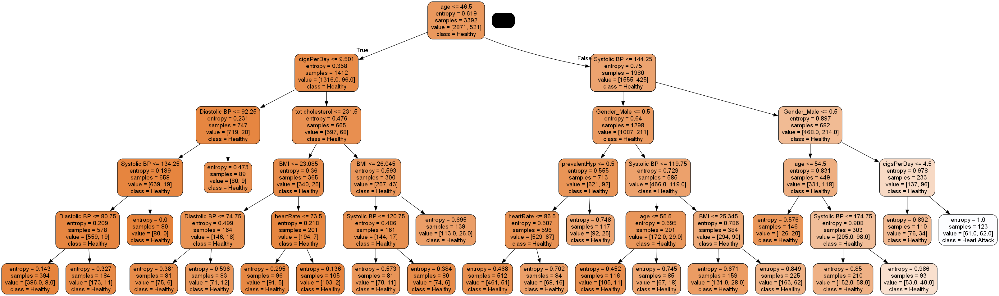

In [121]:
gph = get_dt_graph(dt_best)
Image(gph.create_png())

In [122]:
with open('bestmodel.png', 'wb') as f:
    f.write(gph.create_png())

In [123]:
evaluate_model(dt_best)

Train Accuracy : 0.8466981132075472
Train Confusion Matrix:
[[2810   61]
 [ 459   62]]
--------------------------------------------------
Test Accuracy : 0.8537735849056604
Test Confusion Matrix:
[[714  11]
 [113  10]]


In [128]:
y_test.value_counts()

Heart-Att
0    725
1    123
Name: count, dtype: int64

#### Classification Report with F1 Score of Decision Tree Classifier

In [124]:
from sklearn.metrics import classification_report

In [125]:
print(classification_report(y_test, dt_best.predict(X_test)))

              precision    recall  f1-score   support

           0       0.86      0.98      0.92       725
           1       0.48      0.08      0.14       123

    accuracy                           0.85       848
   macro avg       0.67      0.53      0.53       848
weighted avg       0.81      0.85      0.81       848



#### F1 Score of DT

In [132]:
f1 = f1_score( y_test,dt_best.predict(X_test), average="weighted")
print(f1)

0.806790183492187


#### Confusion Matrix for Decision Tree Classifier Prediction

<Axes: >

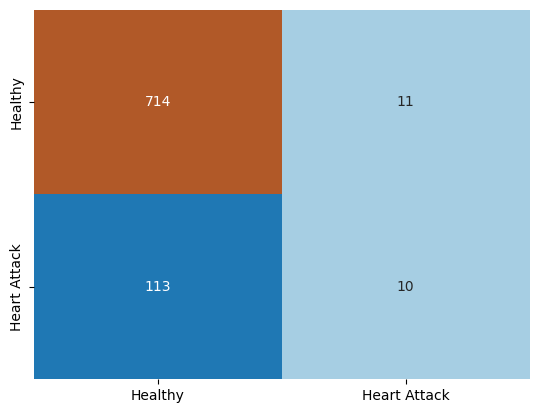

In [127]:
import seaborn as sns

pred = dt_best.predict(X_test)
# confusion matrix
cmat = confusion_matrix(y_test, pred)

# plot heatmap
sns.heatmap(cmat, annot=True, cmap='Paired', 
            cbar=False, fmt="d", xticklabels=[
            'Healthy', 'Heart Attack'], yticklabels=['Healthy', 'Heart Attack'])

#### E) PART 2 Model Preparation and Evaluation using Naive Bayes

In [64]:
from sklearn.naive_bayes import GaussianNB

model = GaussianNB()

model.fit(X_train, y_train)

GaussianNB()

#### Naive Bayes Model Evaluation

In [130]:
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
    classification_report,
)

y_pred = model.predict(X_test)

accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_test, y_pred, average="weighted")

print("Accuracy:", accuracy)
print("F1 Score:", f1)

Accuracy: 0.8325471698113207
F1 Score: 0.8077682342192185


#### Classification Report with F1 Score for Naive Bayes 

In [131]:
print(classification_report(y_test, model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.87      0.94      0.91       725
           1       0.34      0.17      0.23       123

    accuracy                           0.83       848
   macro avg       0.61      0.56      0.57       848
weighted avg       0.79      0.83      0.81       848



#### Confusion Matrix for Naive Bayes

Confusion Matrix: The diagonal elements represent the number of points for which the predicted label is equal to the true label, while off-diagonal elements are those that are mislabeled by the classifier. The higher the diagonal values of the confusion matrix the better, indicating many correct predictions

In [69]:
evaluate_model(model)

Train Accuracy : 0.8225235849056604
Train Confusion Matrix:
[[2675  196]
 [ 406  115]]
--------------------------------------------------
Test Accuracy : 0.8325471698113207
Test Confusion Matrix:
[[685  40]
 [102  21]]


<Axes: >

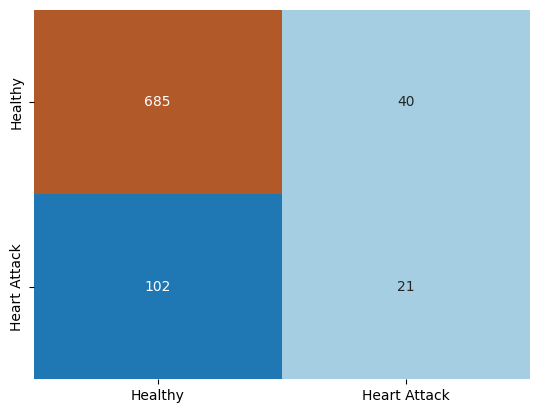

In [70]:
import seaborn as sns

pred = model.predict(X_test)
# confusion matrix
cmat = confusion_matrix(y_test, pred)

# plot heatmap
sns.heatmap(cmat, annot=True, cmap='Paired', 
            cbar=False, fmt="d", xticklabels=[
            'Healthy', 'Heart Attack'], yticklabels=['Healthy', 'Heart Attack'])

### E) Comparision of Naive Bayes and Decision Tree Classifier
#### Based on Confusion Matrix

Comparing Confusion Matrix of both classifier seems that Decision Tree CLassifier is more accurate in identifying the Healthy and Heart Attack Patient, however confusion is more in Naive Bayes. 

##### Decision Tree:
-------------
Correct Healthy (TP): 714 <br>
Incorrect Healthy (FP): 11 <br>
Incorrect Heart Attack(FN): 113 <br>
Correct Heart Attack(TN): 10 <br> 
Accuracy: 0.85 <br>

##### Naive Bayes:
-------------
Correct Healthy (TP): 685 <br>
Incorrect Healthy (FP): 40 <br>
Incorrect Heart Attack(FN): 102 <br>
Correct Heart Attack(TN): 21 <br>
Accuracy: 0.83

**Since Accuracy for Decision Tree is More, so Decision Tree classifier is the best model**

### E) Comparision of Naive Bayes and Decision Tree Classifier
#### Based on F1 Score

F1 Score: F1 score is a machine learning evaluation metric that measures a model’s accuracy. It combines the precision and recall scores of a model. The accuracy metric computes how many times a model made a correct prediction across the entire dataset.
The F1 score is an important evaluation metric that is commonly used in classification tasks to evaluate the performance of a model.
F1 score is an alternative machine learning evaluation metric that assesses the predictive skill of a model by elaborating on its class-wise performance rather than an overall performance as done by accuracy. 

F1 Score of DT is: 0.81 <br>
F1 Score of NB is: 0.81 <br>

F1 Score is same for both the classifiers, So both models are performing same and can't find best out of it